In [1]:
import pandas as pd
import sqlalchemy as sa
from sqlalchemy.dialects.postgresql import JSON, JSONB
from sqlalchemy.ext.declarative import declarative_base
from sqlalchemy.orm import sessionmaker
import json
import csv
import datetime
from dateutil.parser import parser
import os
from pprint import pprint
from pathlib import Path
import glob
#from odo import odo
import importlib
import itertools
import sklearn.cluster
import pandas as pd
import numpy as np
import math
import operator
import sklearn
import matplotlib.pyplot as plt

#importlib.invalidate_caches()
%load_ext autoreload
%autoreload 2

In [2]:
clusters = pd.read_pickle('../Pickle_Files/clustered_songs.pkl')
audio_features = pd.read_pickle('../Pickle_Files/audio_features.pkl')

In [3]:
songs = pd.merge(clusters,audio_features,on='track_uri')

## PCA Visualization of Clusters

#### Normalizing

In [4]:
from sklearn.preprocessing import StandardScaler
features = ['acousticness', 'danceability', 'energy','instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'valence']
# Separating out the features
x = songs.loc[:, features].values
# Separating out the target
# Standardizing the features
x = StandardScaler().fit_transform(x)

In [5]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])

In [6]:
cluster_audio_tracks_PCA = songs.reset_index()

In [7]:
cluster_audio_tracks_PCA = cluster_audio_tracks_PCA[['track_uri','cluster']]

In [8]:
finalDf = principalDf.join(cluster_audio_tracks_PCA, how='outer')

In [9]:
finalDf['cluster'] = finalDf['cluster'].apply(str)

In [10]:
finalDf['cluster'].value_counts()

6     354753
3     301046
2     299047
1     277806
8     261159
11    216820
10    172465
5     162875
7      82345
0      81250
4      49121
9       3028
Name: cluster, dtype: int64

## PCA Representation of All Songs Using Clusters

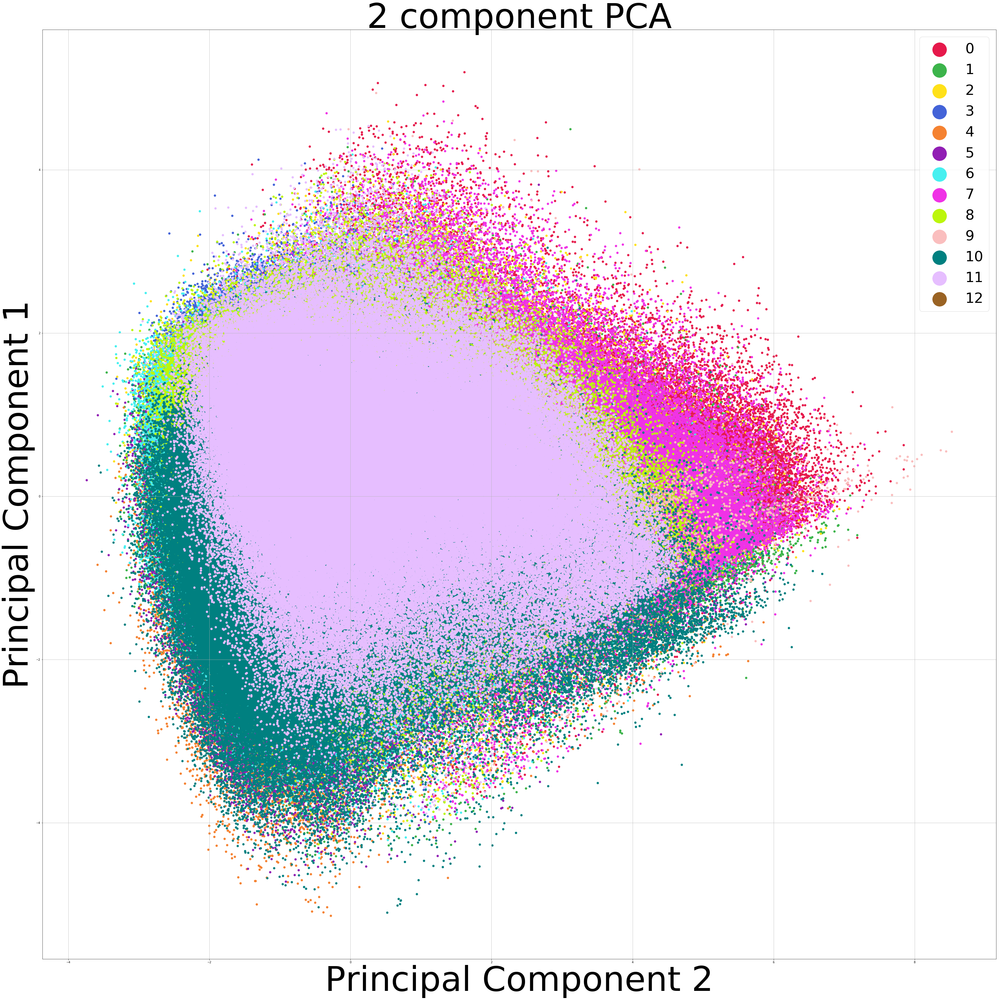

In [11]:
fig = plt.figure(figsize = (60,60))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 2', fontsize = 120)
ax.set_ylabel('Principal Component 1', fontsize = 120)
ax.set_title('2 component PCA', fontsize = 120)
targets = ['0','1','2','3','4','5','6','7','8','9','10','11','12']
colors = ['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['cluster'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets, prop={'size': 50},markerscale=7)
ax.grid()

## Choose the Clusters you would like to Compare and run the below code

In [33]:
import ipywidgets as widgets
from ipywidgets import Layout

style = {'description_width': 'initial'}

choose_clusters = widgets.Dropdown(
    options=[0,1,2,3,4,5,6,7,8,9,10,11],
    value=4,
    description='First Cluster:',
    layout=Layout(width='30%', height='50px',left='10px'),
    disabled=False,
)
display(choose_clusters)

choose_clusters2 = widgets.Dropdown(
    options=[0,1,2,3,4,5,6,7,8,9,10,11],
    value=7,
    description='Second Cluster:',style=style,
    layout=Layout(width='31.4%', height='50px',top='0px',left='-4px'),
    disabled=False,
)
display(choose_clusters2)

Dropdown(description='First Cluster:', index=4, layout=Layout(height='50px', left='10px', width='30%'), option…

Dropdown(description='Second Cluster:', index=7, layout=Layout(height='50px', left='-4px', top='0px', width='3…

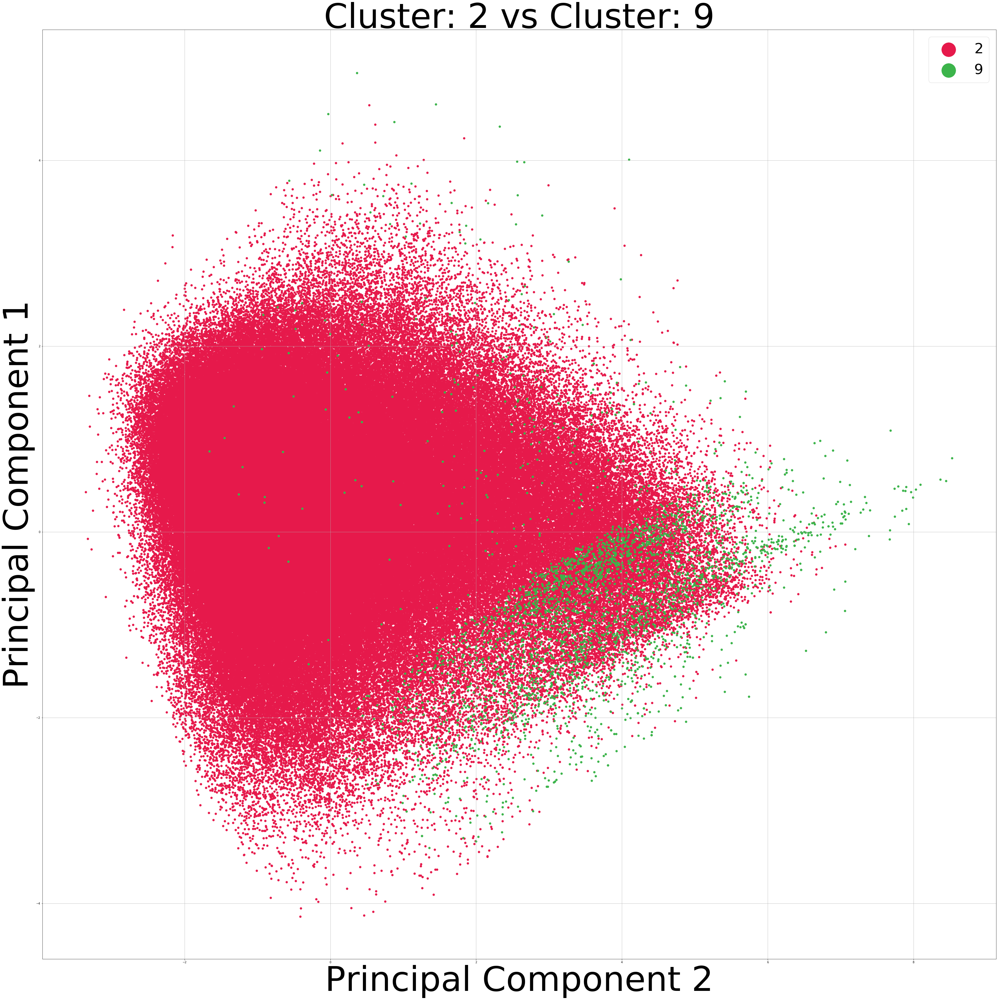

In [37]:
fig = plt.figure(figsize = (60,60))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 2', fontsize = 120)
ax.set_ylabel('Principal Component 1', fontsize = 120)
ax.set_title(str('Cluster: ' + str(choose_clusters.value) + ' vs Cluster: ' + str(choose_clusters2.value)), fontsize = 120)
targets = [''+str(choose_clusters.value)+'',''+str(choose_clusters2.value)+'']
colors = ['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['cluster'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets, prop={'size': 50},markerscale=7)
ax.grid()

## PCA Representation of All Songs Using Artists

In [14]:
tracks = pd.read_pickle('../Pickle_Files/tracks.pkl')

In [15]:
artists = tracks[['artist_name','artist_uri','track_uri']]

In [16]:
artists = pd.merge(artists,finalDf,on='track_uri')

In [17]:
artists_PCA = artists.drop(['track_uri'],axis=1)
artists_PCA.head(3)

,artist_name,artist_uri,principal component 1,principal component 2,cluster
0,Trent Harmon,spotify:artist:1YSoHvvSAY0oOJW7VxJx3M,-0.683177,-0.228842,3
1,Brett Eldredge,spotify:artist:0qSX3s5pJnAlSsgsCne8Cz,-0.872768,-0.857628,1
2,Jon Pardi,spotify:artist:4MoAOfV4ROWofLG3a3hhBN,-1.212127,0.266067,8


In [18]:
artists_PCA.head(3)

,artist_name,artist_uri,principal component 1,principal component 2,cluster
0,Trent Harmon,spotify:artist:1YSoHvvSAY0oOJW7VxJx3M,-0.683177,-0.228842,3
1,Brett Eldredge,spotify:artist:0qSX3s5pJnAlSsgsCne8Cz,-0.872768,-0.857628,1
2,Jon Pardi,spotify:artist:4MoAOfV4ROWofLG3a3hhBN,-1.212127,0.266067,8


In [19]:
labels, levels = pd.factorize(artists_PCA['artist_uri'])

## Compare One Artist Against Another
<br> Use the slider to pick different artists

In [31]:
import ipywidgets as widgets
from ipywidgets import Layout

style = {'description_width': 'initial'}

choose_artist1 = widgets.IntSlider(
    value=3879,
    min=0,
    max=artists['artist_uri'].nunique(),
    step=1,
    description='First Artist:',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='d'
)

display(choose_artist1)

choose_artist2 = widgets.IntSlider(
    value=6381,
    min=0,
    max=artists['artist_uri'].nunique(),
    step=1,
    description='First Artist:',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='d',
)
display(choose_artist2)

IntSlider(value=3879, continuous_update=False, description='First Artist:', max=295437)

IntSlider(value=6381, continuous_update=False, description='First Artist:', max=295437)

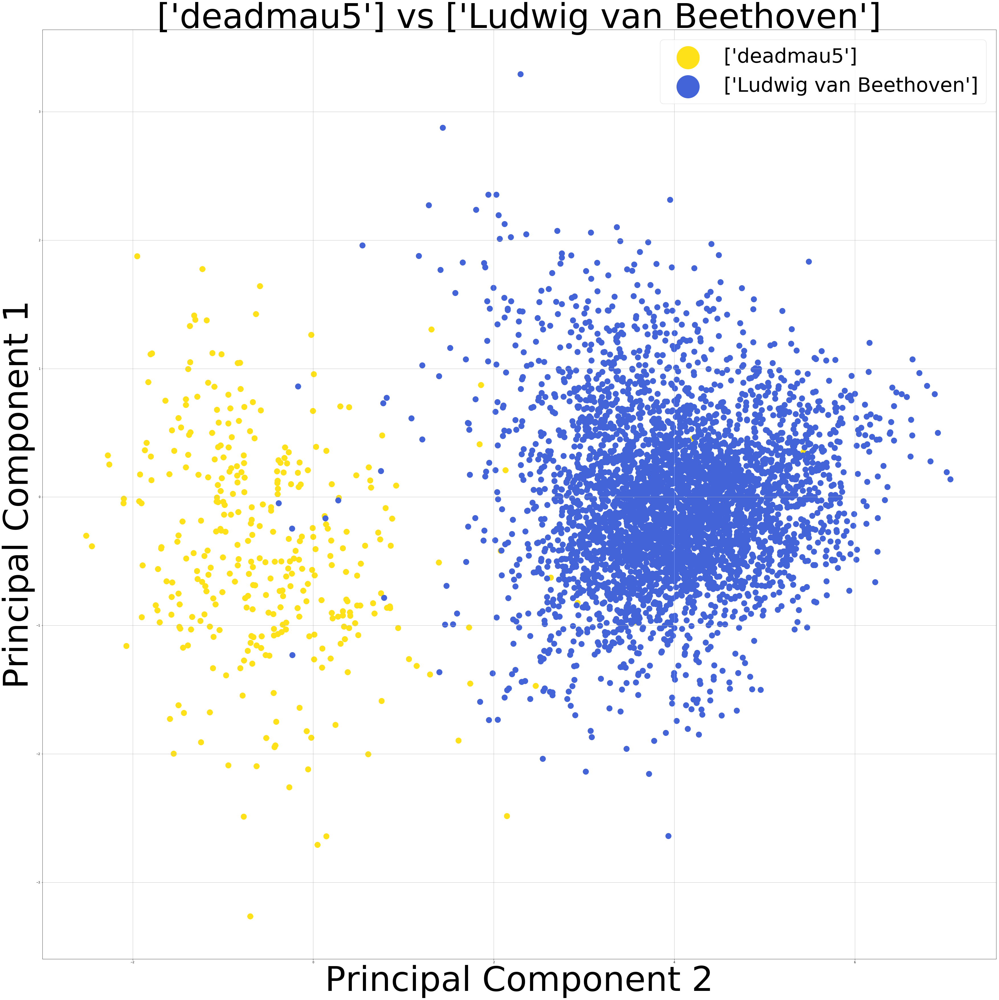

In [32]:
artist1 = artists[artists['artist_uri']==levels[choose_artist1.value]].artist_name.head(1).tolist() ## gets 1st artists name
artist2 = artists[artists['artist_uri']==levels[choose_artist2.value]].artist_name.head(1).tolist() ## gets 2nd artists name

fig = plt.figure(figsize = (60,60))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 2', fontsize = 120)
ax.set_ylabel('Principal Component 1', fontsize = 120)
ax.set_title(str(str(artist1) + ' vs ' + str(artist2)), fontsize = 120)
targets = [''+str(levels[choose_artist1.value])+'',''+str(levels[choose_artist2.value])+'']
colors = ['#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324']
for target, color in zip(targets,colors):
    indicesToKeep = artists_PCA['artist_uri'] == target
    ax.scatter(artists_PCA.loc[indicesToKeep, 'principal component 1']
               , artists_PCA.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 400)
ax.legend([artist1,artist2], prop={'size': 70},markerscale=4)
ax.grid()

# Interesting Examples

## The Beatles (60's Pop) vs Avicii (DJ)

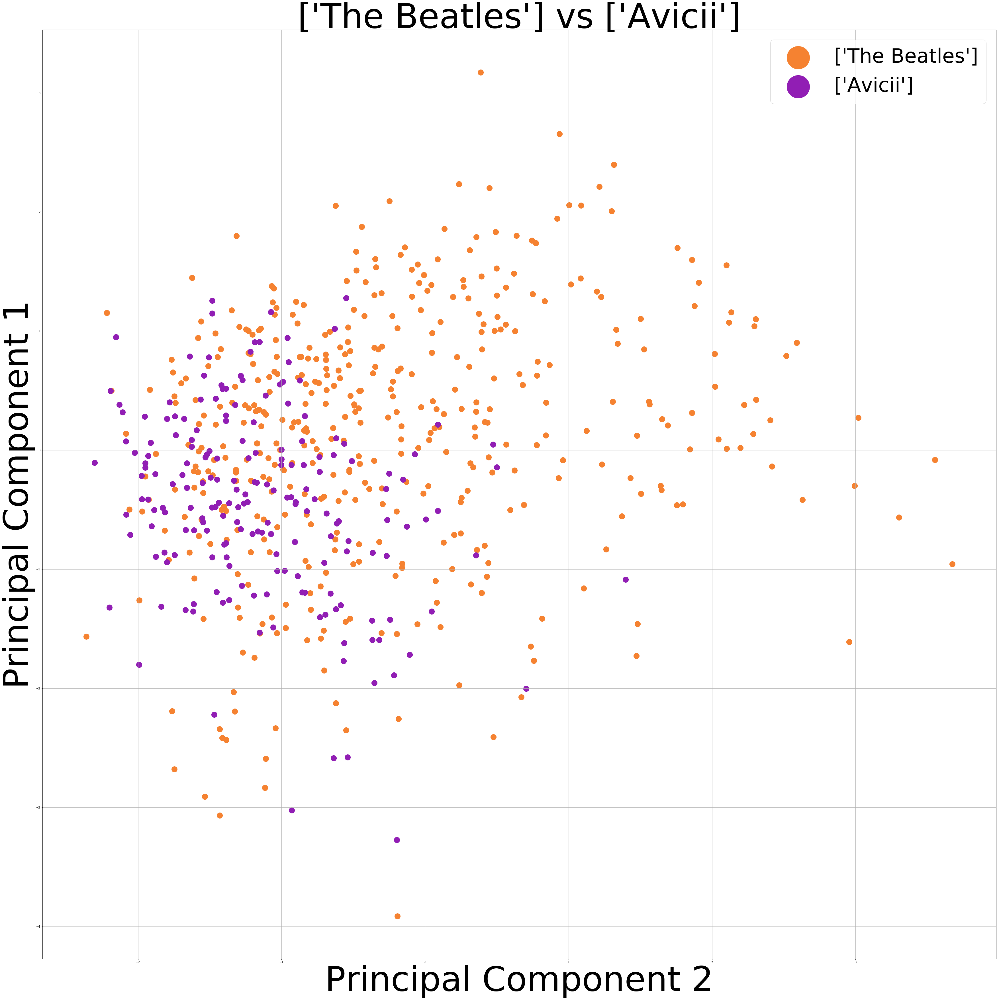

In [22]:
artist1 = artists[artists['artist_uri']==levels[714]].artist_name.head(1).tolist() ## gets 1st artists name
artist2 = artists[artists['artist_uri']==levels[484]].artist_name.head(1).tolist() ## gets 2nd artists name

fig = plt.figure(figsize = (60,60))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 2', fontsize = 120)
ax.set_ylabel('Principal Component 1', fontsize = 120)
ax.set_title(str(str(artist1) + ' vs ' + str(artist2)), fontsize = 120)
targets = [''+str(levels[714])+'',''+str(levels[484])+'']
colors = ['#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324']
for target, color in zip(targets,colors):
    indicesToKeep = artists_PCA['artist_uri'] == target
    ax.scatter(artists_PCA.loc[indicesToKeep, 'principal component 1']
               , artists_PCA.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 400)
ax.legend([artist1,artist2], prop={'size': 70},markerscale=4)
ax.grid()

### Eminem (Rap) vs Metallica (Metal)

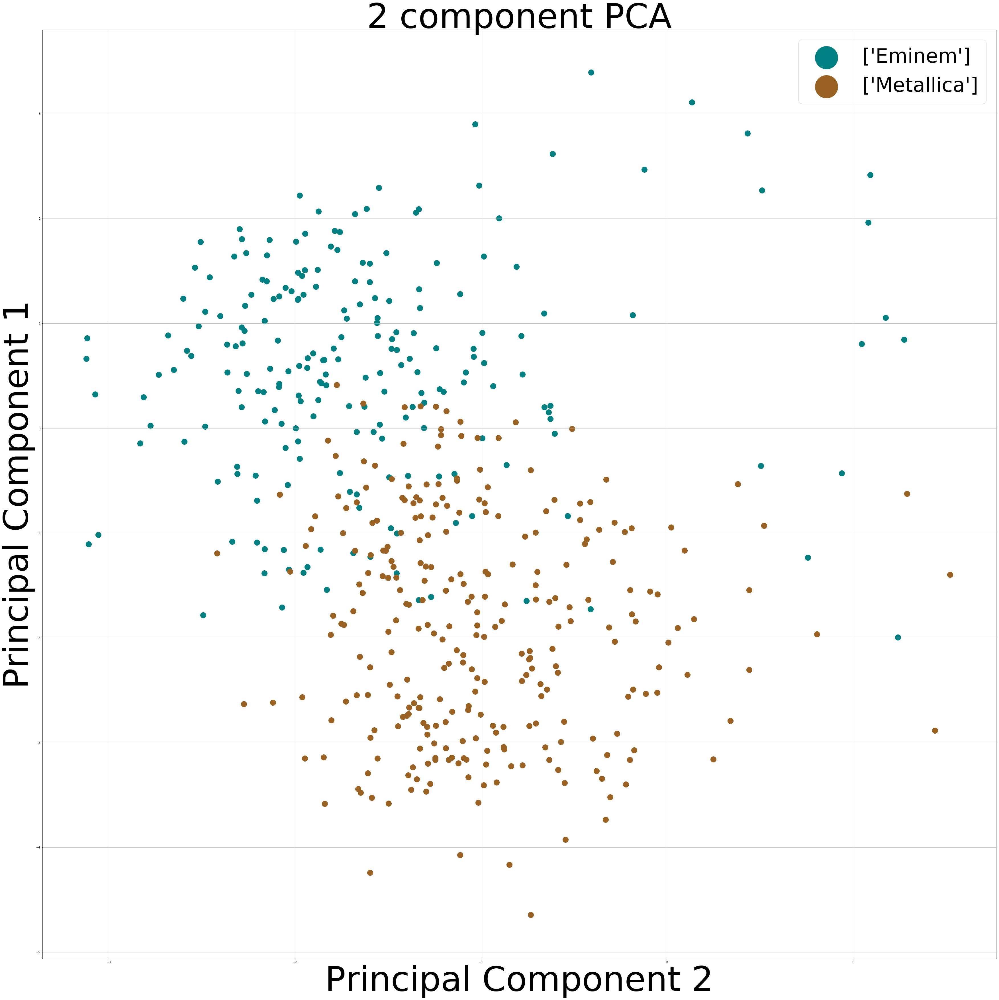

In [23]:
artist1 = artists[artists['artist_uri']==levels[576]].artist_name.head(1).tolist() ## gets 1st artists name
artist2 = artists[artists['artist_uri']==levels[1883]].artist_name.head(1).tolist() ## gets 2nd artists name

fig = plt.figure(figsize = (60,60))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 2', fontsize = 120)
ax.set_ylabel('Principal Component 1', fontsize = 120)
ax.set_title('2 component PCA', fontsize = 120)
targets = [''+str(levels[576])+'',''+str(levels[1883])+'']
colors = ['#008080','#9a6324']
for target, color in zip(targets,colors):
    indicesToKeep = artists_PCA['artist_uri'] == target
    ax.scatter(artists_PCA.loc[indicesToKeep, 'principal component 1']
               , artists_PCA.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 400)
ax.legend([artist1,artist2], prop={'size': 70},markerscale=4)
ax.grid()

### Nirvana (Grunge) vs Louis Armstrong (Jazz)

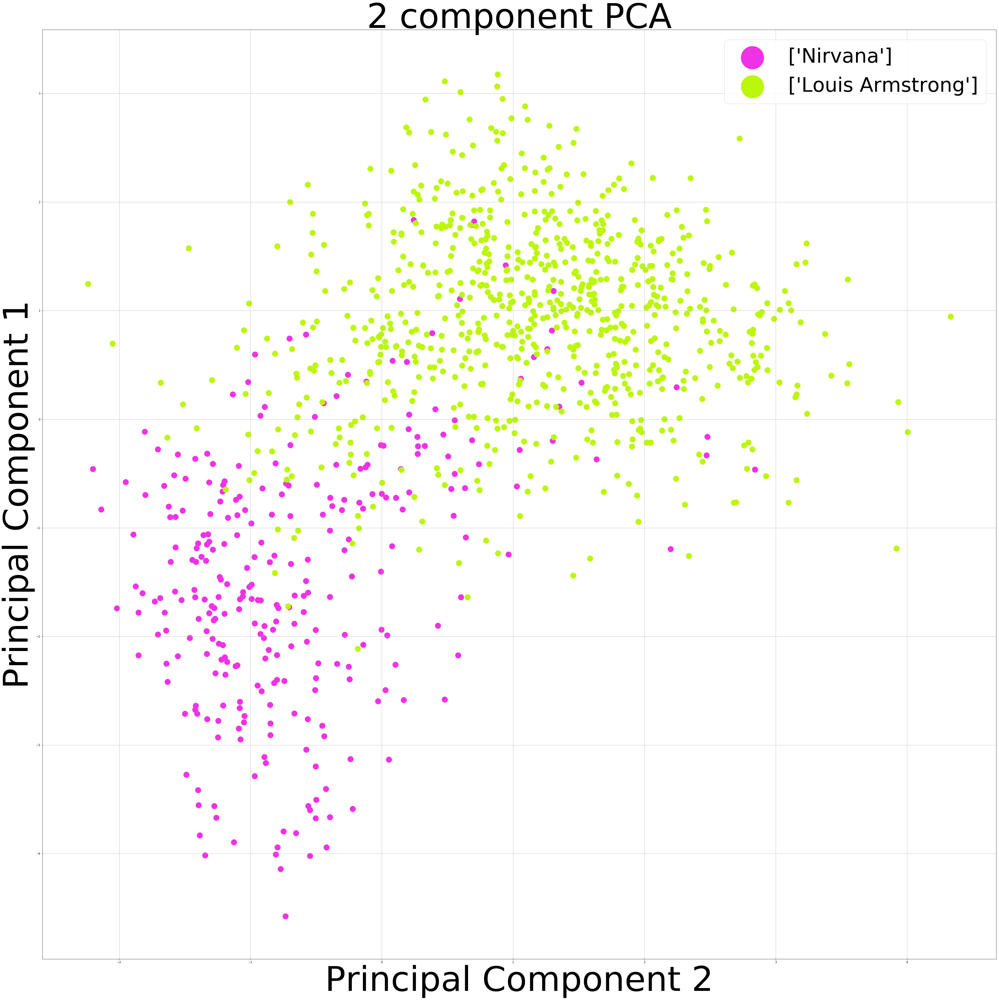

In [24]:
artist1 = artists[artists['artist_uri']==levels[268]].artist_name.head(1).tolist() ## gets 1st artists name
artist2 = artists[artists['artist_uri']==levels[419]].artist_name.head(1).tolist() ## gets 2nd artists name

fig = plt.figure(figsize = (60,60))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 2', fontsize = 120)
ax.set_ylabel('Principal Component 1', fontsize = 120)
ax.set_title('2 component PCA', fontsize = 120)
targets = [''+str(levels[268])+'',''+str(levels[419])+'']
colors = ['#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324']
for target, color in zip(targets,colors):
    indicesToKeep = artists_PCA['artist_uri'] == target
    ax.scatter(artists_PCA.loc[indicesToKeep, 'principal component 1']
               , artists_PCA.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 400)
ax.legend([artist1,artist2], prop={'size': 70},markerscale=4)
ax.grid()

### Deadmau5 (Progressive House) vs Ludwig van Beethoven (Classical)

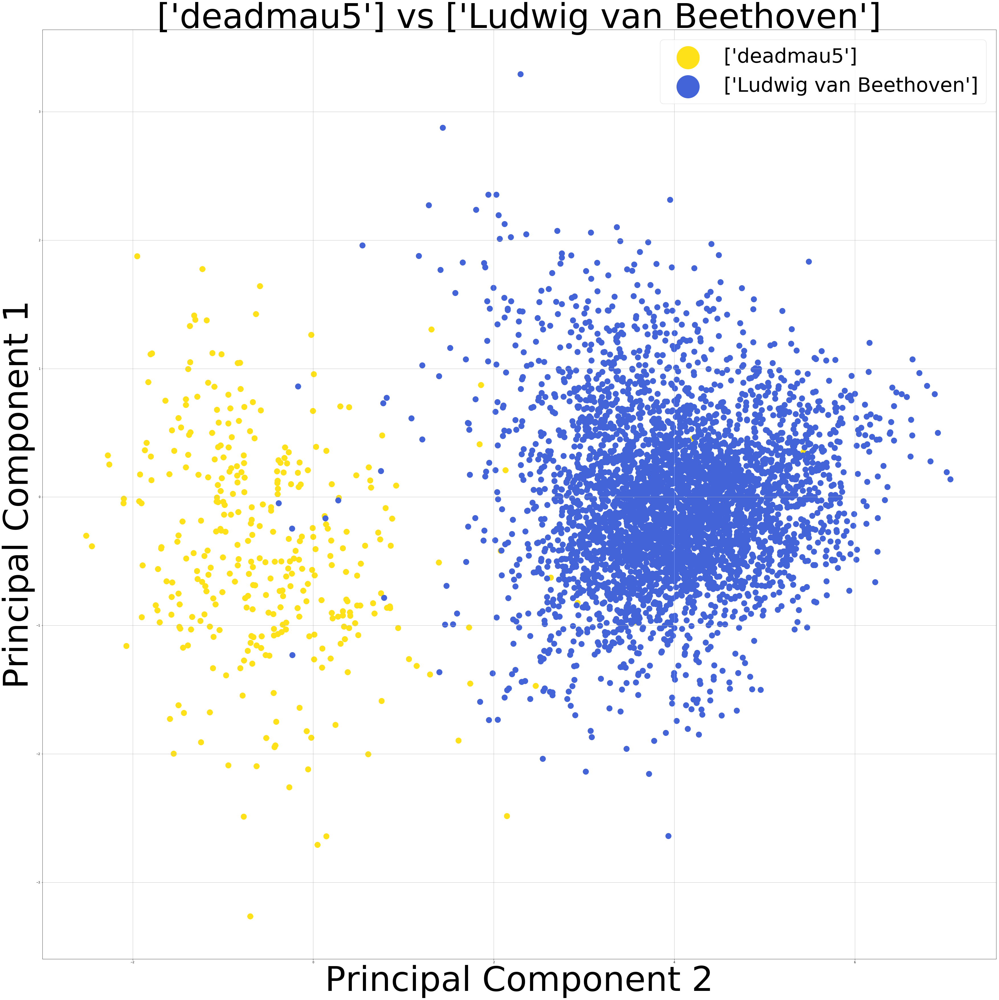

In [25]:
artist1 = artists[artists['artist_uri']==levels[3879]].artist_name.head(1).tolist() ## gets 1st artists name
artist2 = artists[artists['artist_uri']==levels[6381]].artist_name.head(1).tolist() ## gets 2nd artists name

fig = plt.figure(figsize = (60,60))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 2', fontsize = 120)
ax.set_ylabel('Principal Component 1', fontsize = 120)
ax.set_title(str(str(artist1) + ' vs ' + str(artist2)), fontsize = 120)
targets = [''+str(levels[3879])+'',''+str(levels[6381])+'']
colors = ['#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324']
for target, color in zip(targets,colors):
    indicesToKeep = artists_PCA['artist_uri'] == target
    ax.scatter(artists_PCA.loc[indicesToKeep, 'principal component 1']
               , artists_PCA.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 400)
ax.legend([artist1,artist2], prop={'size': 70},markerscale=4)
ax.grid()

##### To search for specific artists use the following
<br> Enter desired artist name below and take the 'artist_uri'

In [26]:
artists[artists['artist_name'].str.contains('Queen')].head(3)

,artist_name,artist_uri,track_uri,principal component 1,principal component 2,cluster
3628,Queen,spotify:artist:1dfeR4HaWDbWqFHLkxsg1d,spotify:track:5T8EDUDqKcs6OSOwEsfqG7,-2.204164,-1.409184,5
3629,Queen,spotify:artist:1dfeR4HaWDbWqFHLkxsg1d,spotify:track:2fuCquhmrzHpu5xcA1ci9x,-0.530039,0.517545,2
3630,Queen,spotify:artist:1dfeR4HaWDbWqFHLkxsg1d,spotify:track:1AhDOtG9vPSOmsWgNW0BEY,0.887710,-0.288503,11


In [27]:
find_artists = pd.DataFrame(levels)
artists_find = ['artists']
find_artists.columns = artists_find

##### Take the artist uri from above and replace in the below and take the index value as level[?] in PCA plot

In [28]:
find_artists[find_artists['artists']=='spotify:artist:1dfeR4HaWDbWqFHLkxsg1d']

,artists
1408,spotify:artist:1dfeR4HaWDbWqFHLkxsg1d
